In [32]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch

# Label dict - Dictionary mapping integer labels to str
label_dict = {0:"gamma", 1:"e", 2:"mu"}

np.set_printoptions(threshold=np.inf)

In [33]:
# Plot the charge distribution for a given batch
def plot_charge_hist(event, recon, iteration, num_bins=100):
    
    # Flatten the input numpy arrays
    event = event.reshape(-1,1)
    recon = recon.reshape(-1,1)
    
    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)
    
    # Setup the bins beforehand
    bins = np.linspace(min(np.amin(event),np.amin(recon),1),
                       max(np.amax(event),np.amax(recon)),
                       num_bins)

    # Plot the histograms overlaid
    plt.hist(event, bins, density=False,
             label="actual", color="red",
             alpha=0.5, stacked=True)
    
    plt.hist(recon, bins, density=False,
             label="reconstructed", color="blue",
             alpha=0.5, stacked=True)
    
    # Setup the axes
    ax.set_xlabel("Charge, c", fontsize=20)
    ax.set_ylabel("Number of hits", fontsize=20)
                  
    plt.yscale("log")
    plt.legend(loc="upper right", prop={"size":20})
    plt.title(r"Actual vs Reconstructed charge distribution at iteration = ${0}$".format(iteration)
              ,fontsize=20)
    
    plt.show()

In [3]:
def plot_vae_training(run_id, model_name, iteration):

    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

    # Setup the path to the training log file
    training_log = dump_dir + "log_train.csv"

    # Plot using the downsample intervals
    plot_utils.plot_vae_training([training_log], [model_name], {model_name:["red", "blue"]},
                             downsample_interval=32, show_plot=True, legend_loc=(0.8,0.8))

    np_arr_path = dump_dir + "iteration_" + str(iteration) + ".npz"

    # Load the numpy array
    np_arr = np.load(np_arr_path)
    np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]

    i = random.randint(0, np_labels.shape[0]-1)
    plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                    label_dict[np_labels[i]], np_energies[i].item(),
                                    show_plot=True)

    plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                     np_recon, 50000, num_bins=200)

## Test 1 : Adding the V in AE

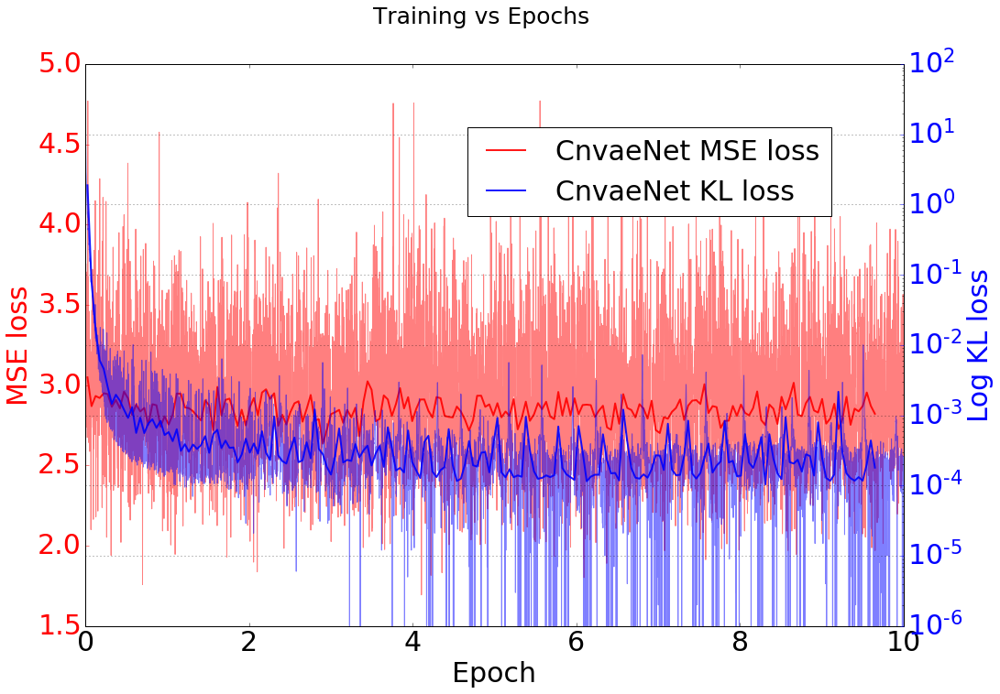

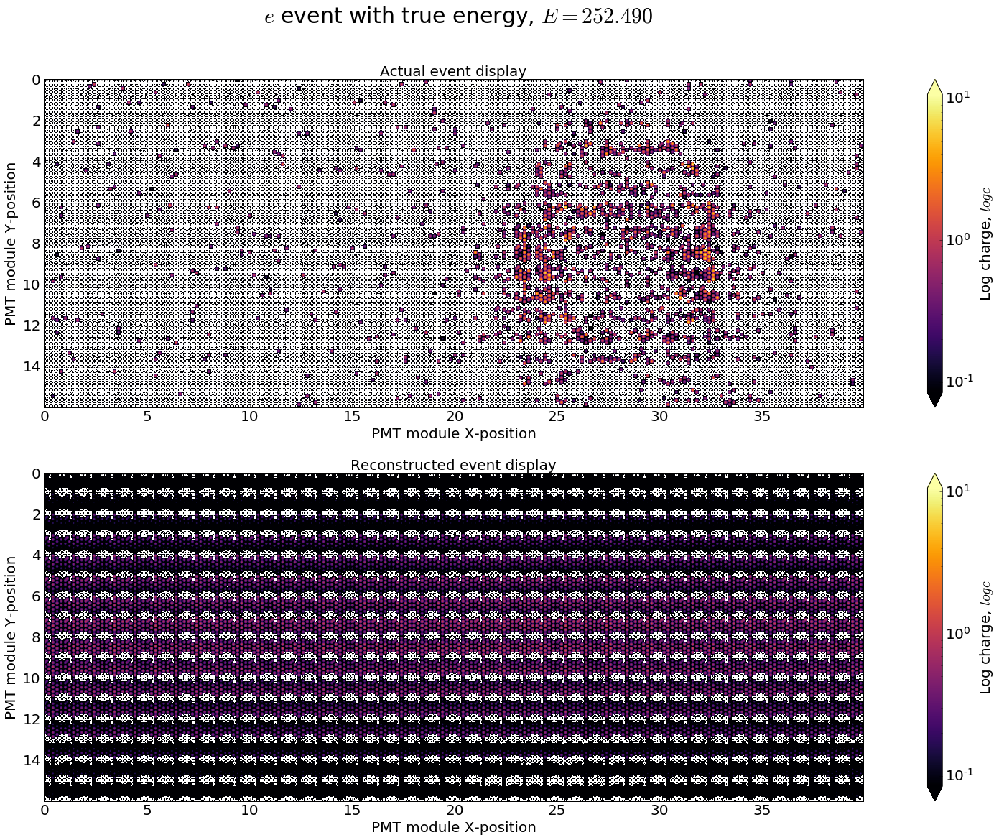

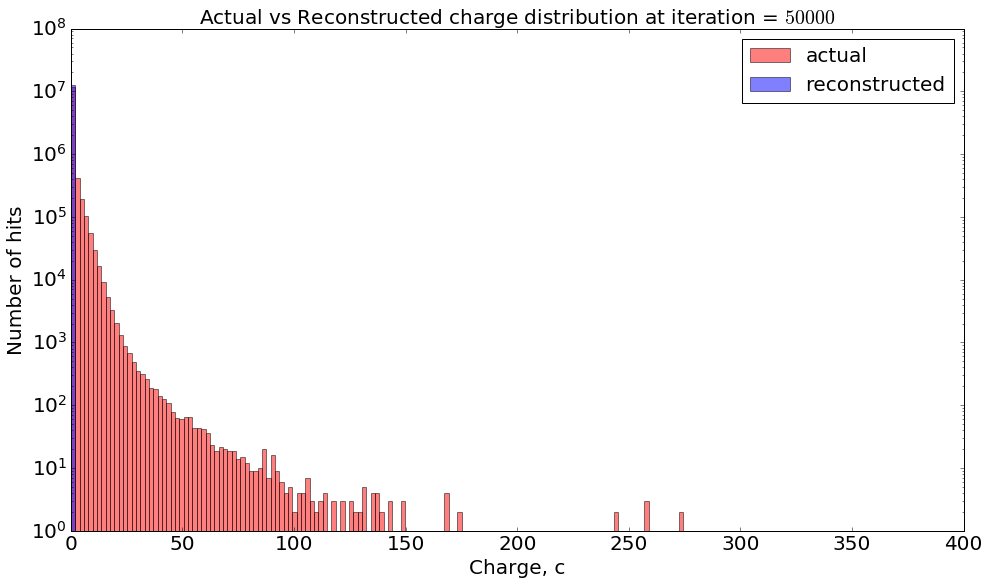

In [5]:
plot_vae_training("20190704_142530", "CnvaeNet", 5999)

## Test 2 : Using a smaller batch size of 2

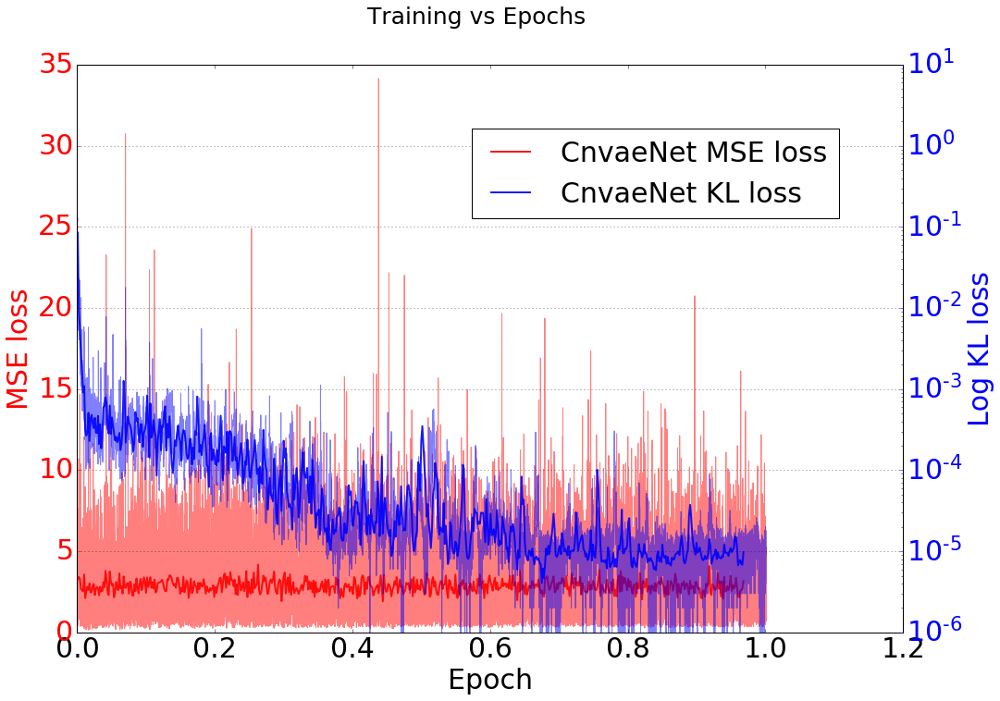

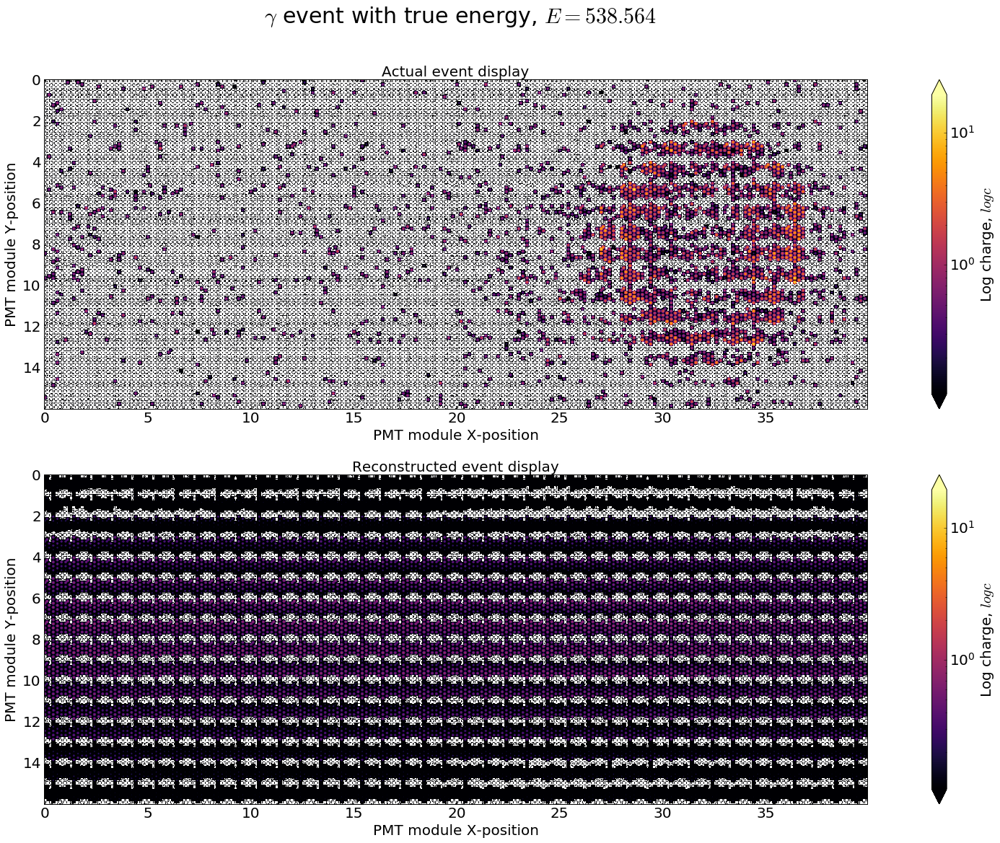

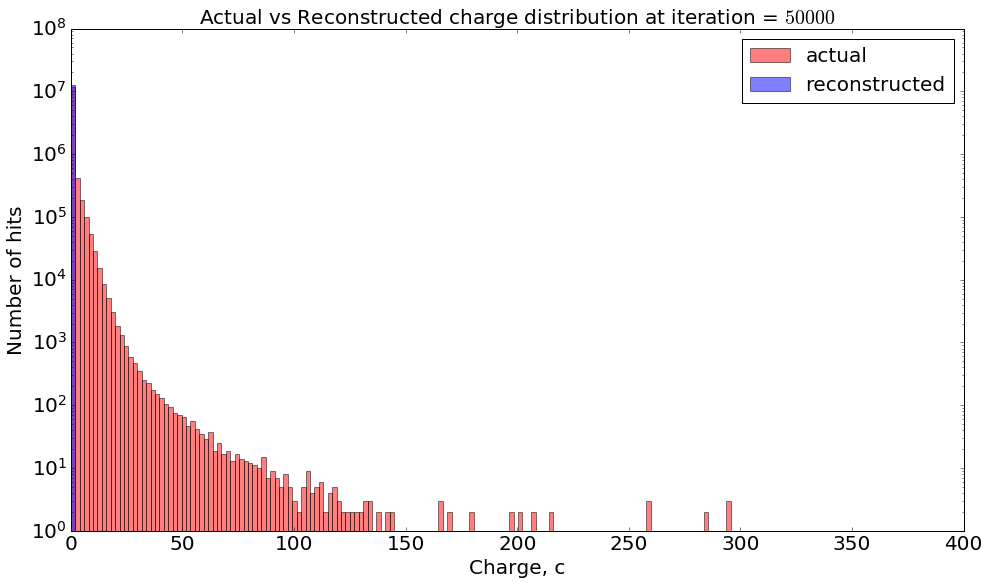

In [12]:
plot_vae_training("20190704_145009", "CnvaeNet", 18999)

## Test 3 : Using a smaller batch size of 4

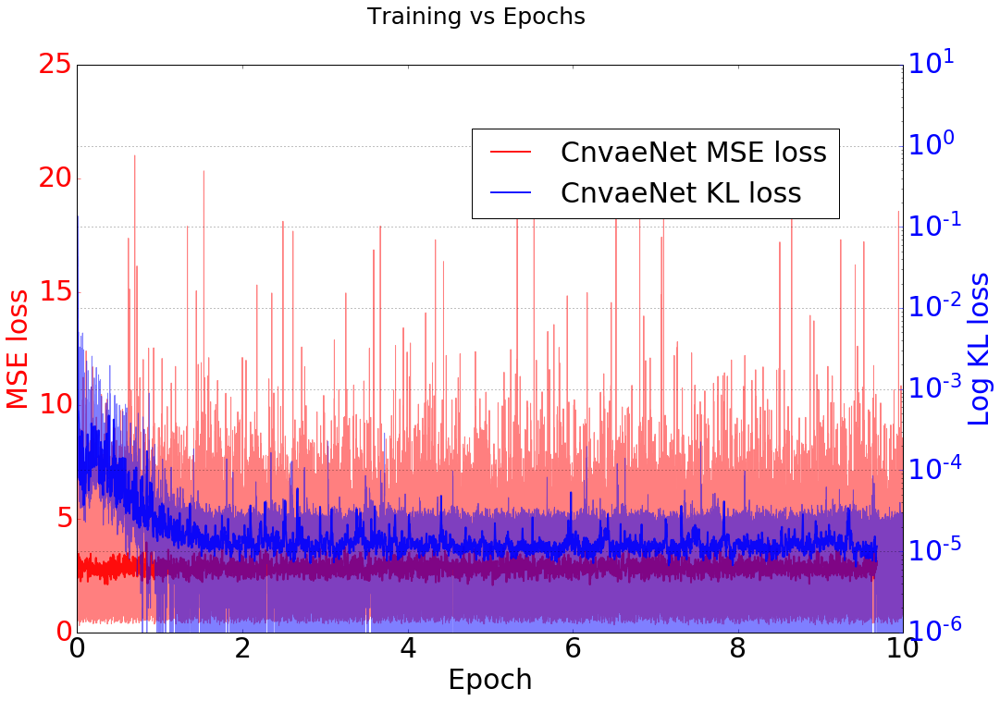

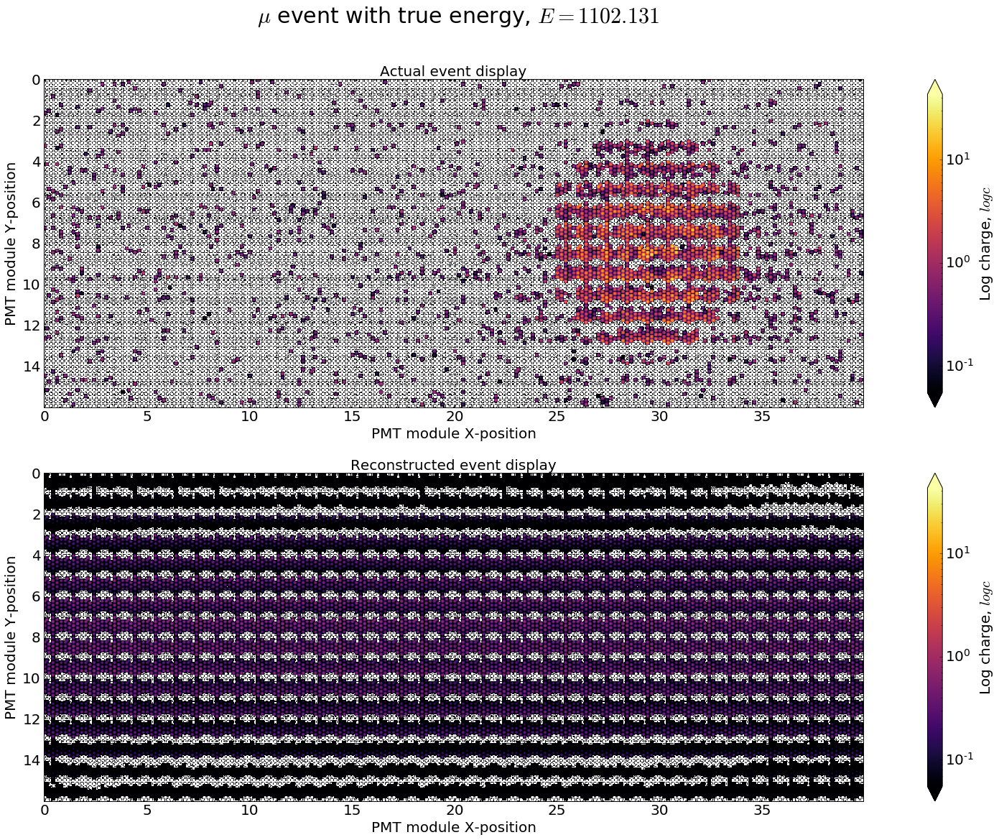

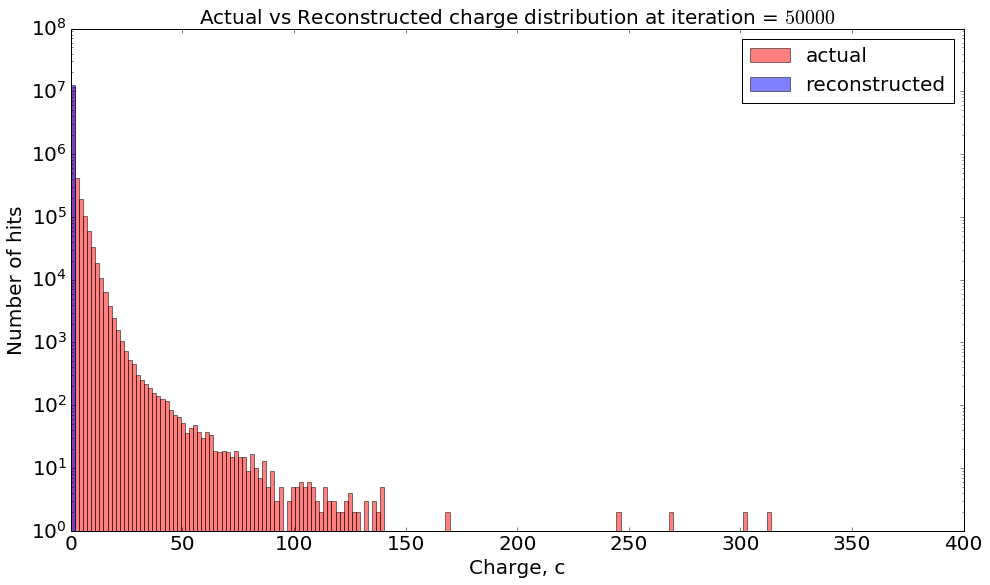

In [16]:
plot_vae_training("20190704_145115", "CnvaeNet", 59999)

## Test 4 : Using a batch size of 64 on the AutoEncoder

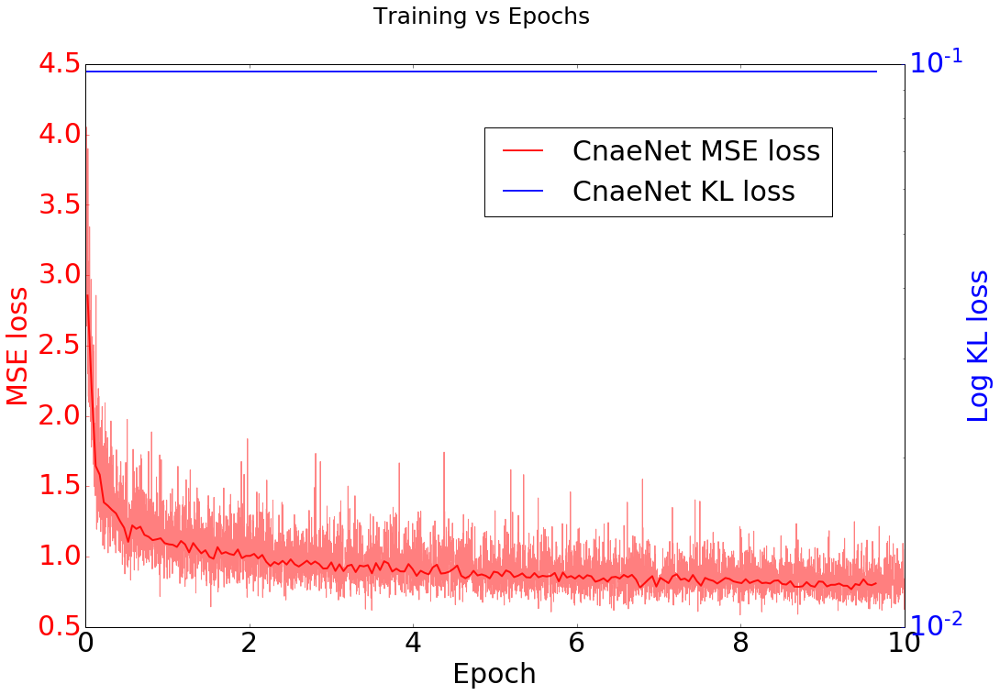

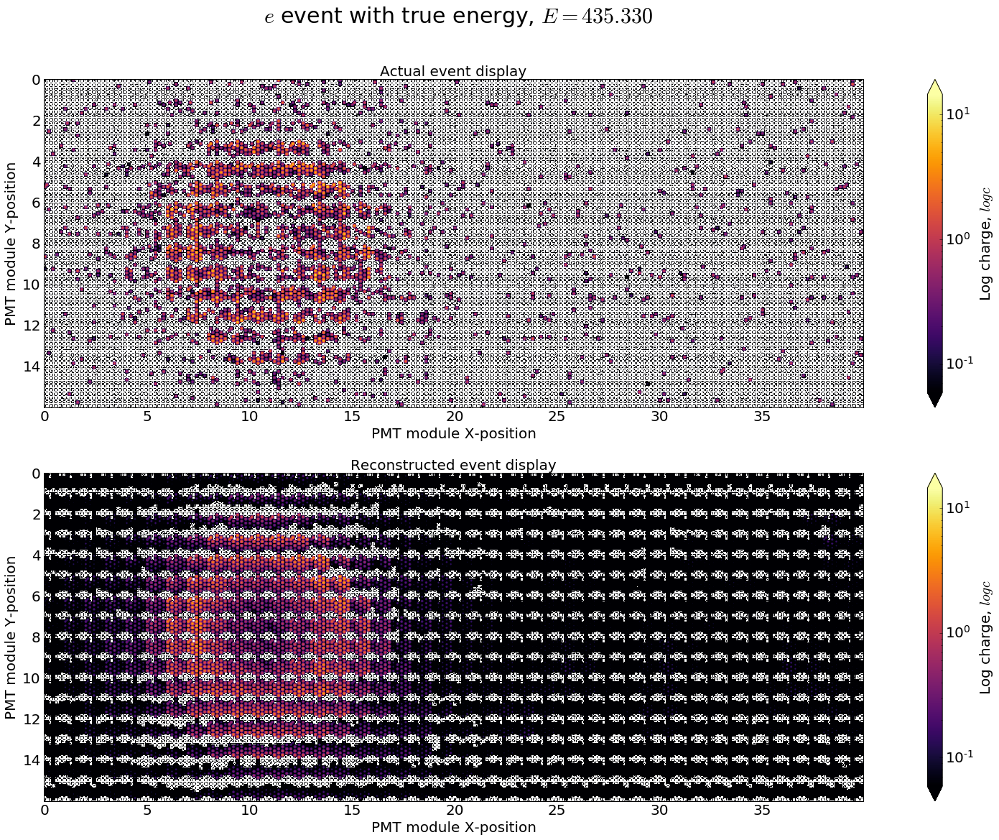

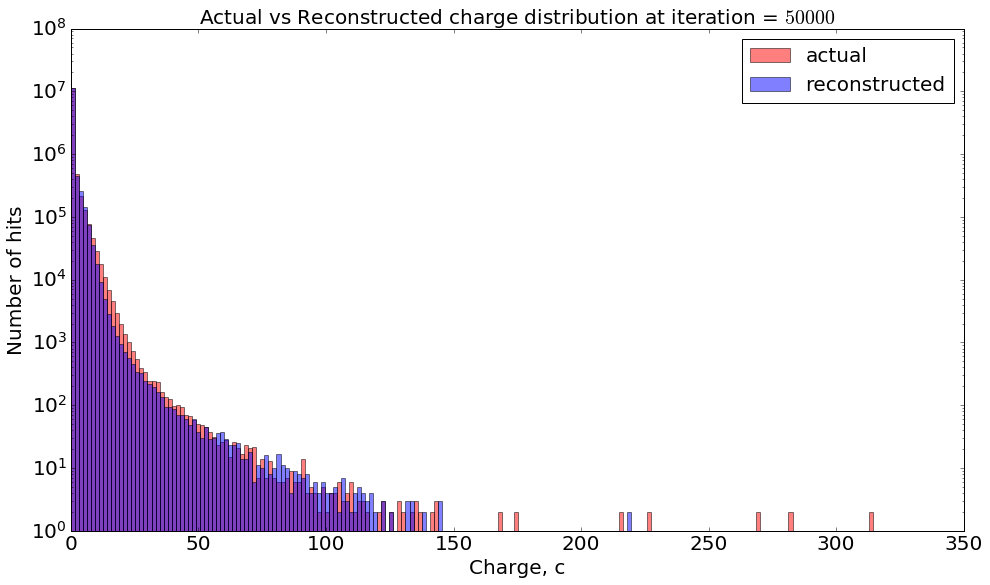

In [17]:
plot_vae_training("20190704_155009", "CnaeNet", 5999)

## Test 5 : Using a batch size of 4 on the AutoEncoder

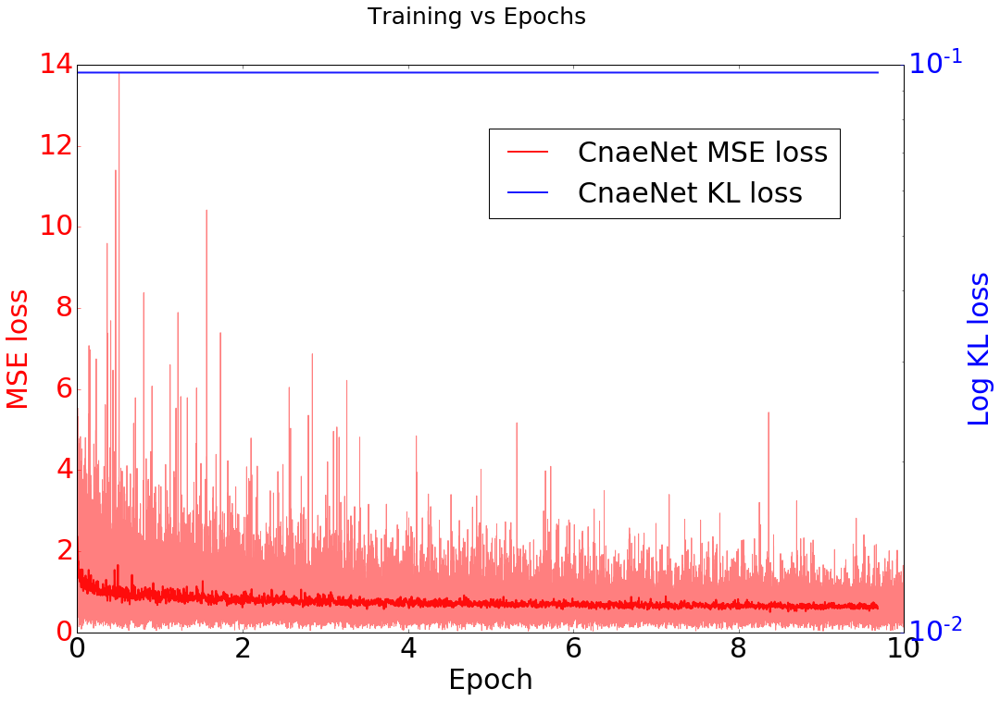

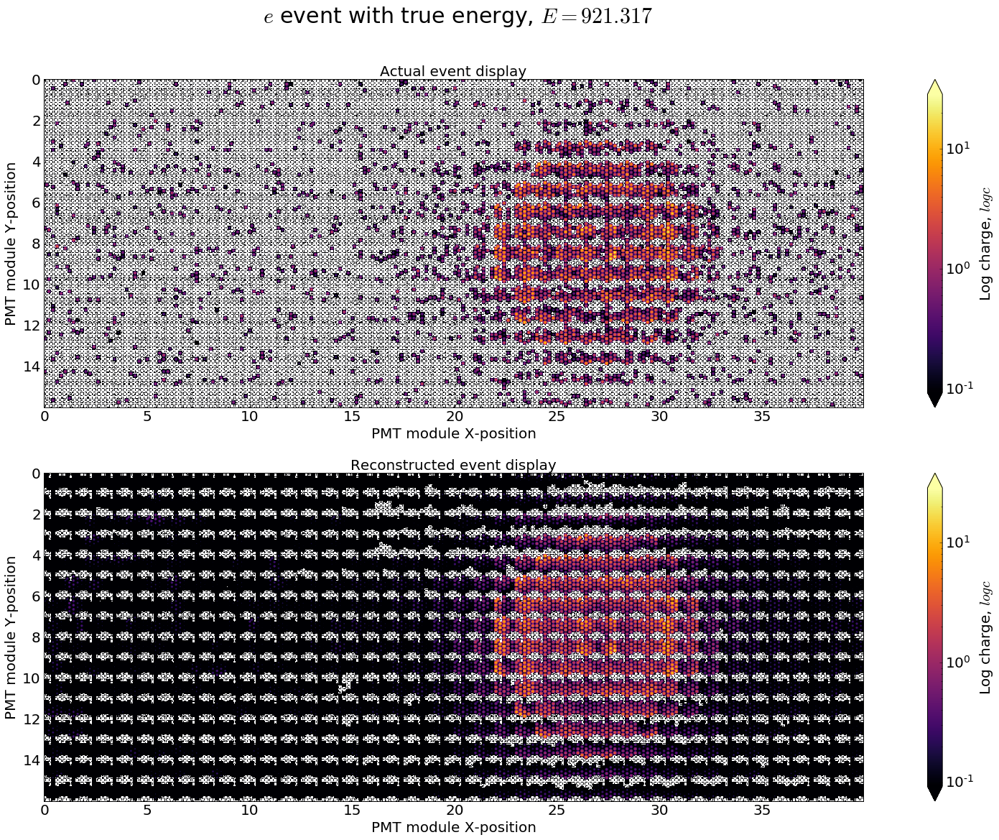

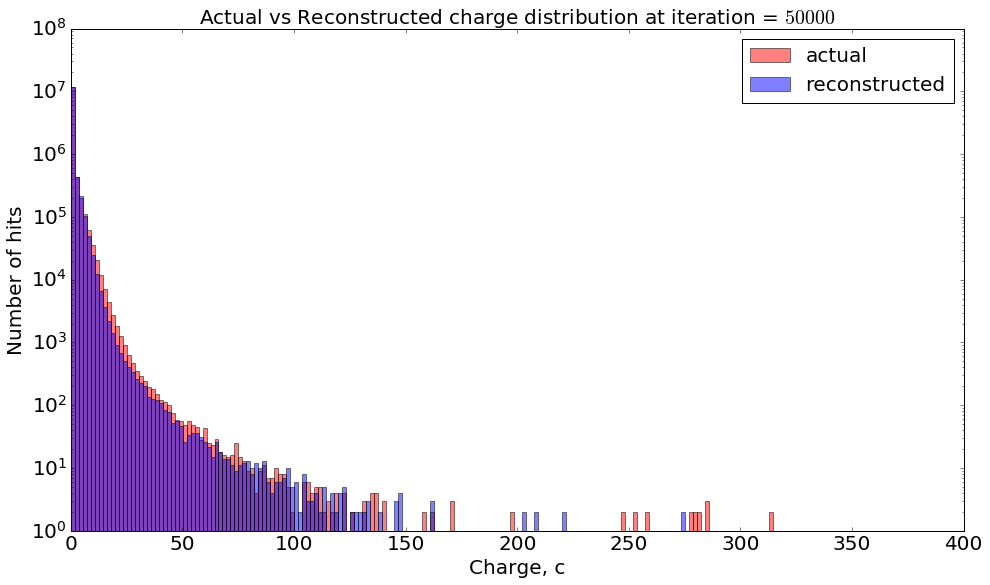

In [4]:
plot_vae_training("20190704_160049", "CnaeNet", 99999)

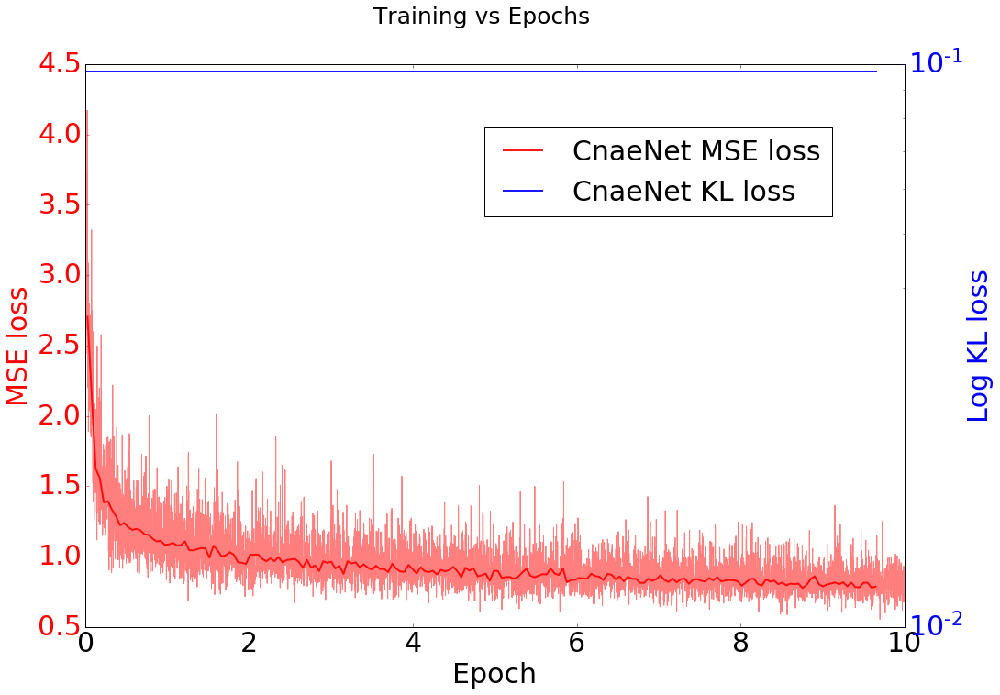

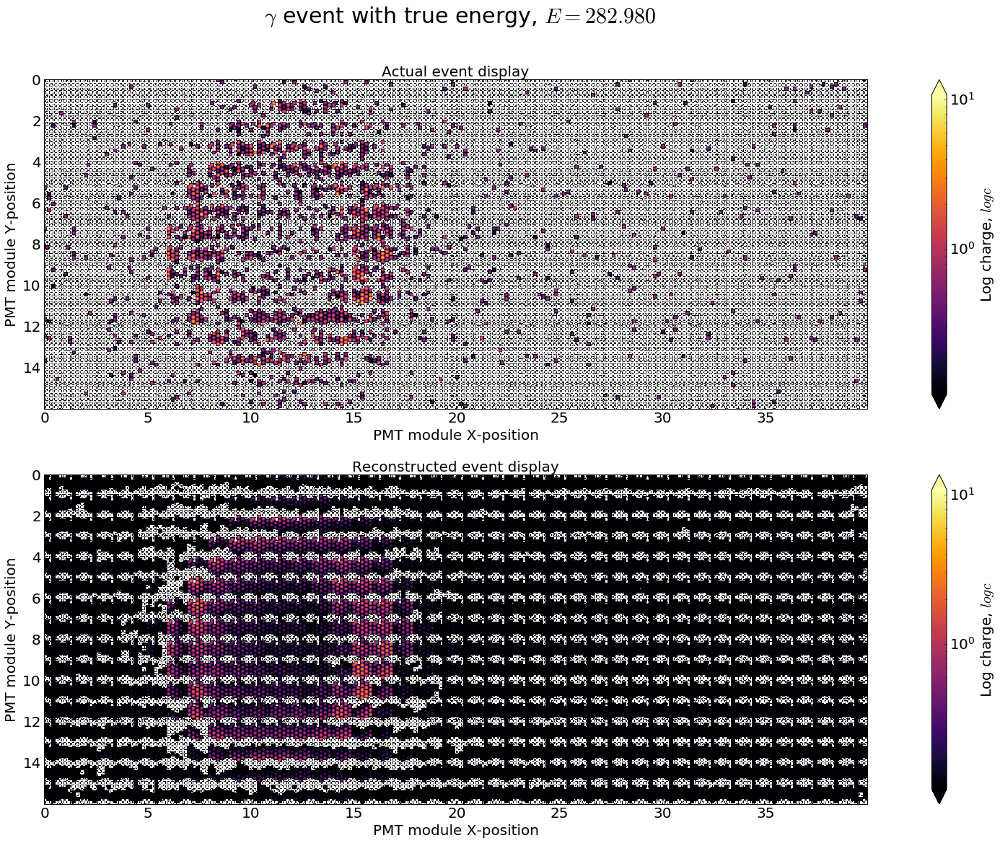

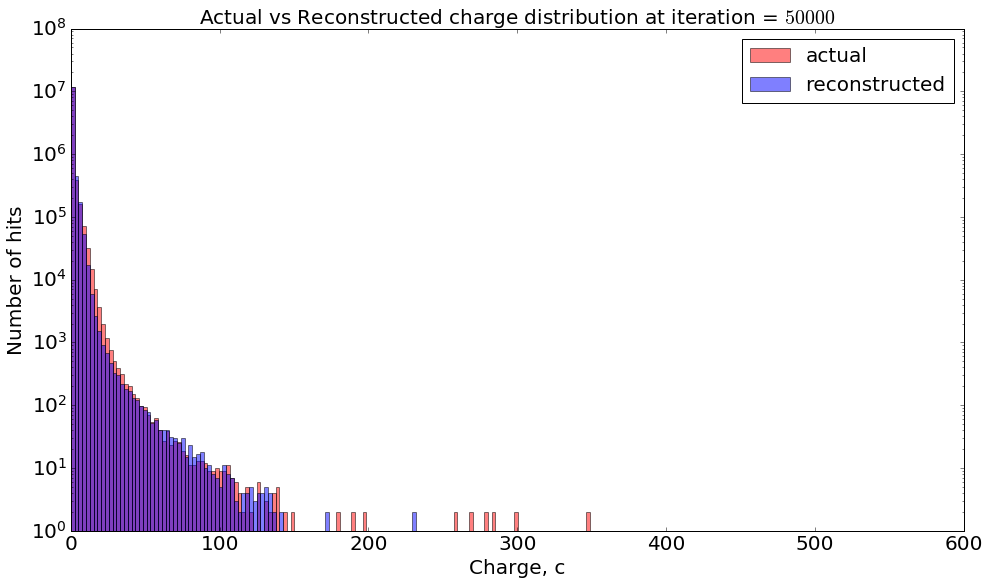

In [5]:
plot_vae_training("20190704_190508", "CnaeNet", 5999)

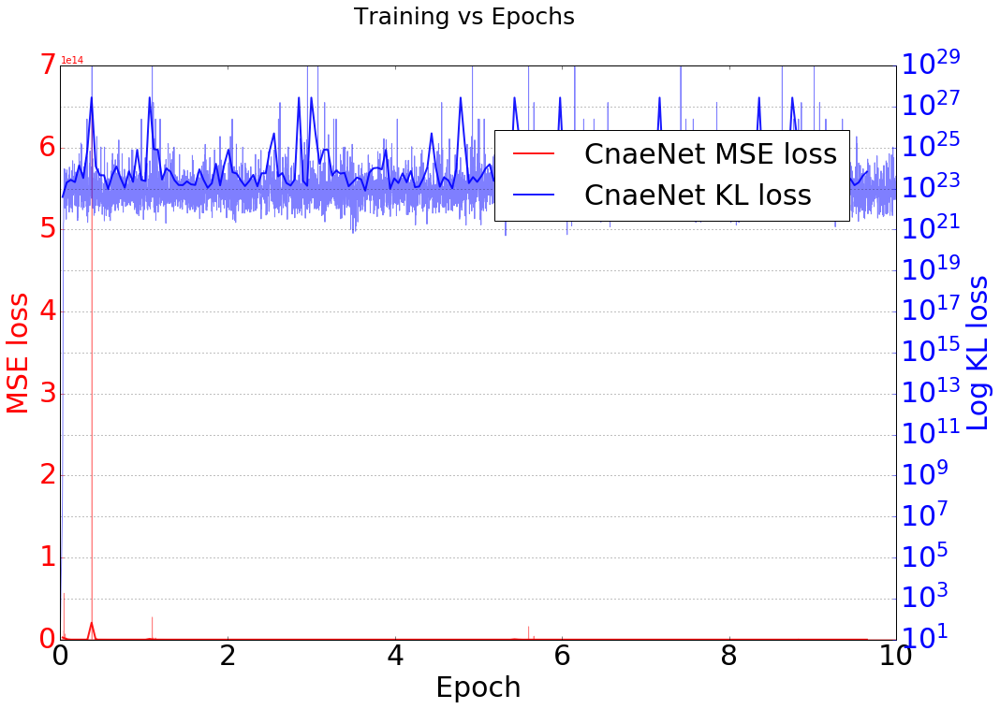

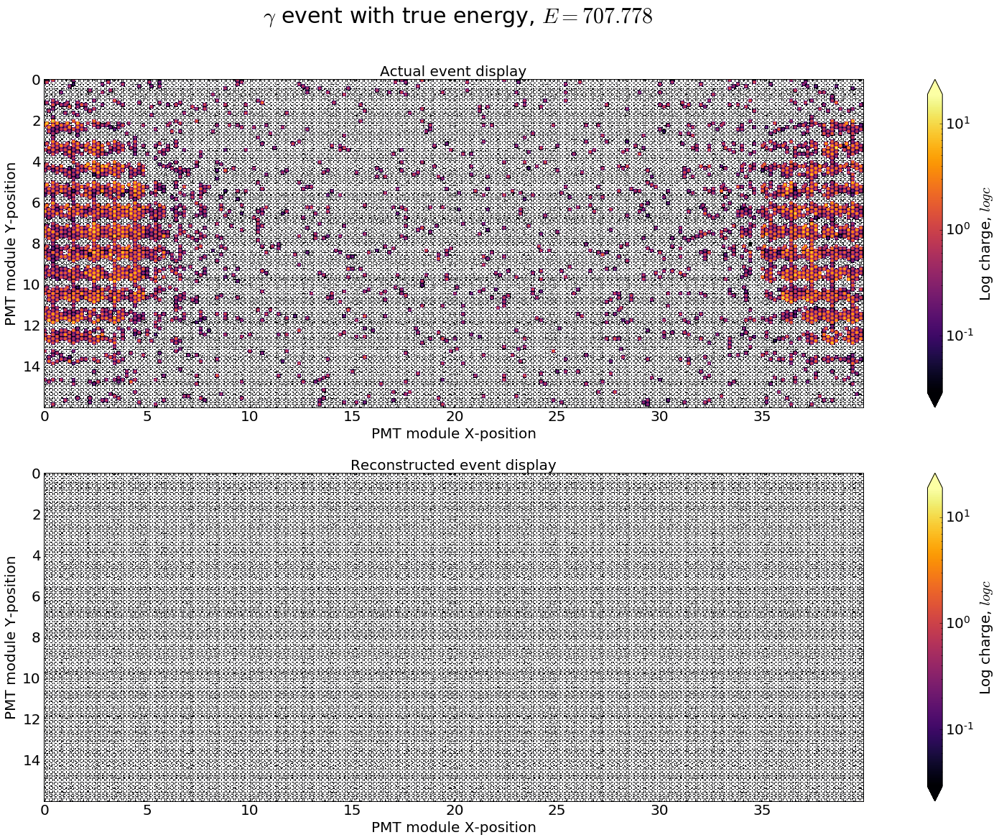

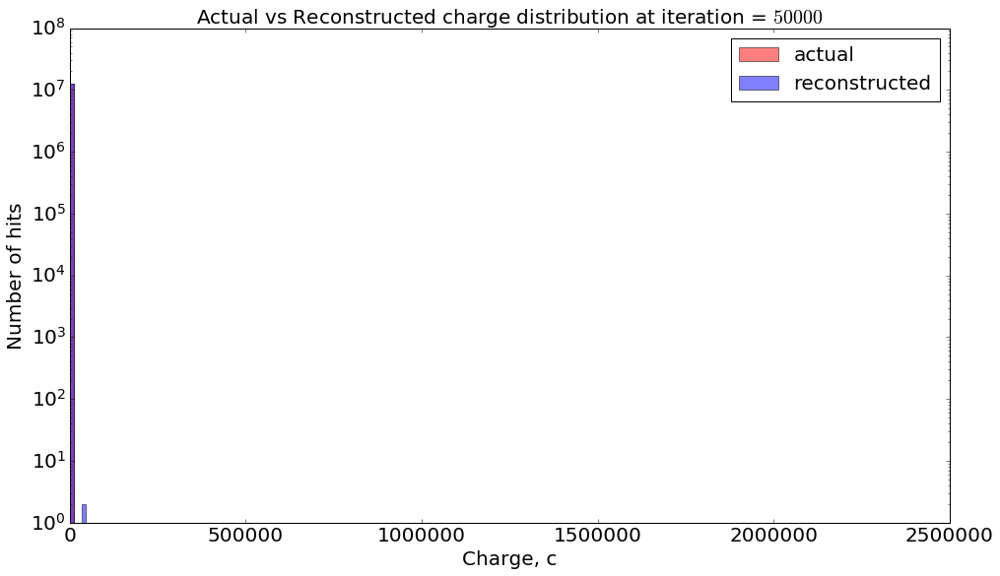

In [6]:
plot_vae_training("20190704_202620", "CnaeNet", 5999)

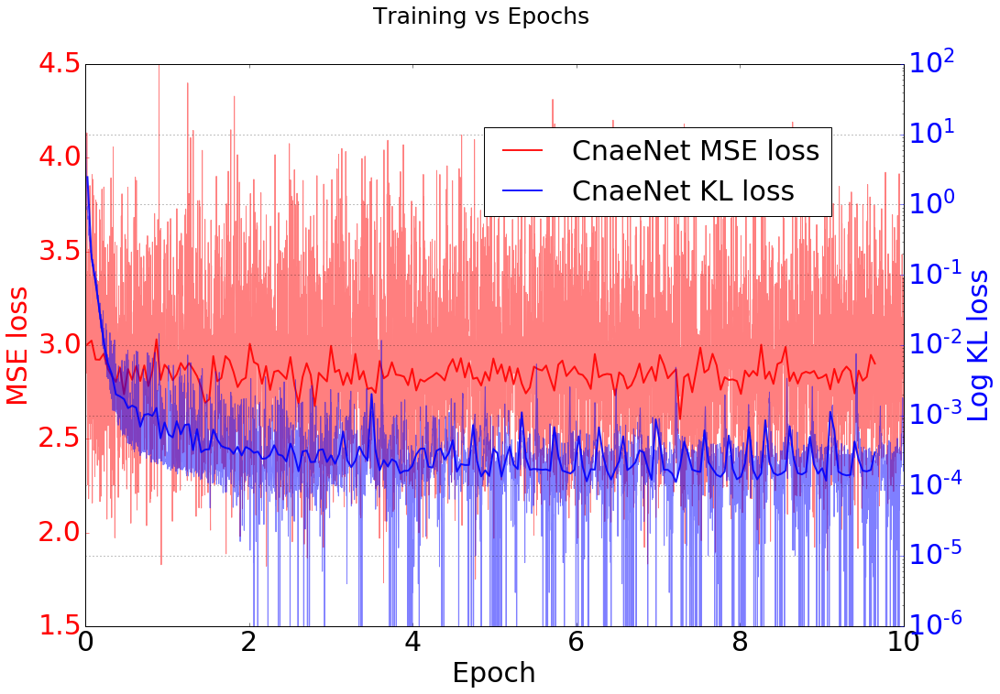

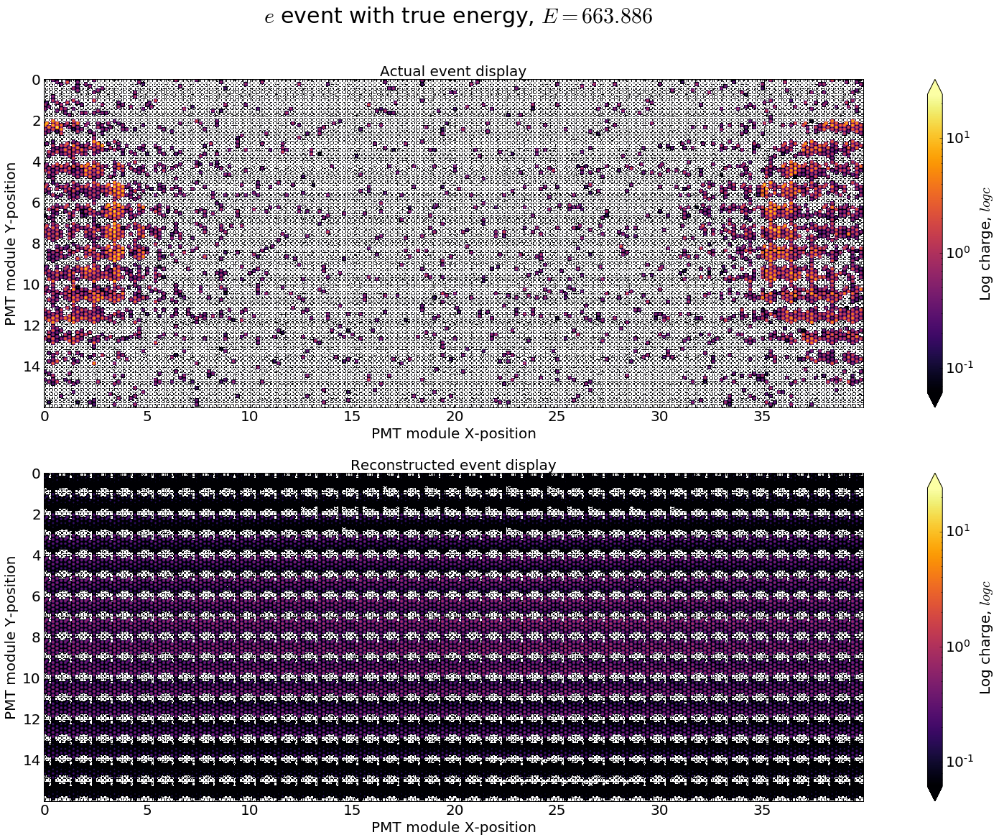

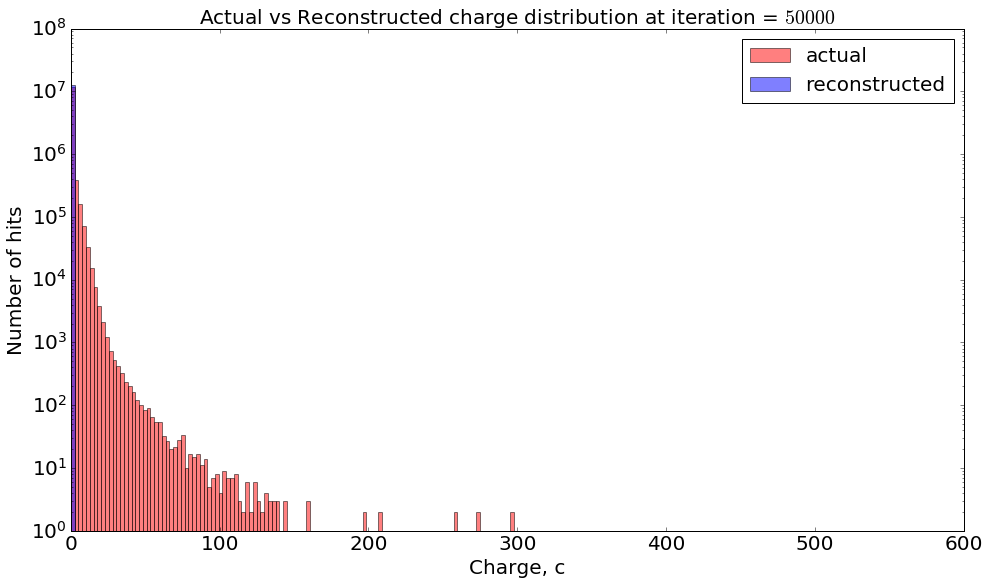

In [7]:
plot_vae_training("20190704_203249", "CnaeNet", 5999)

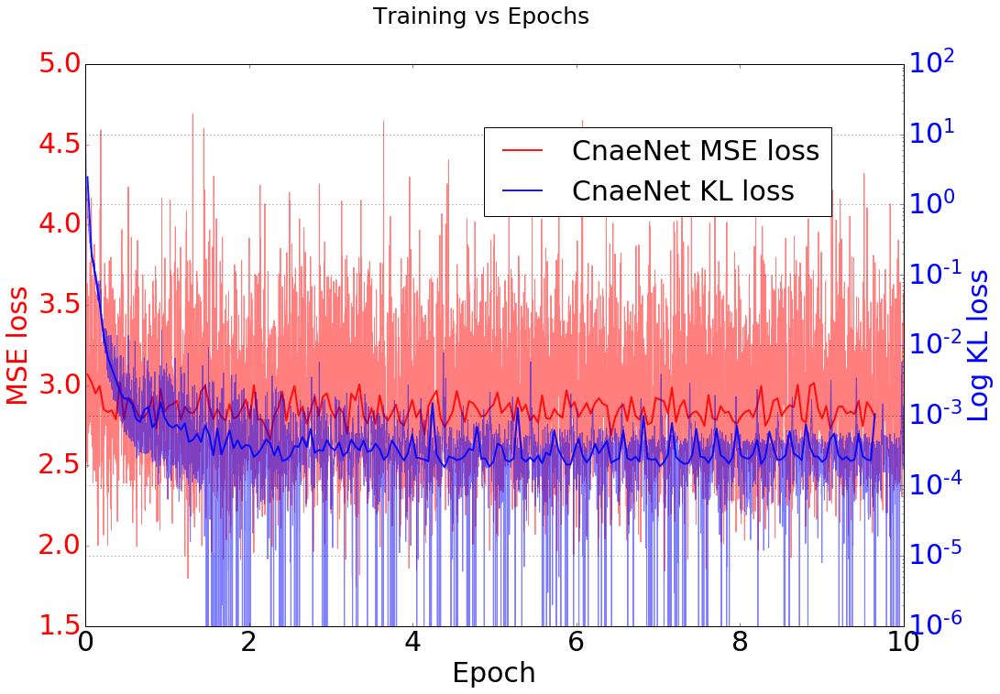

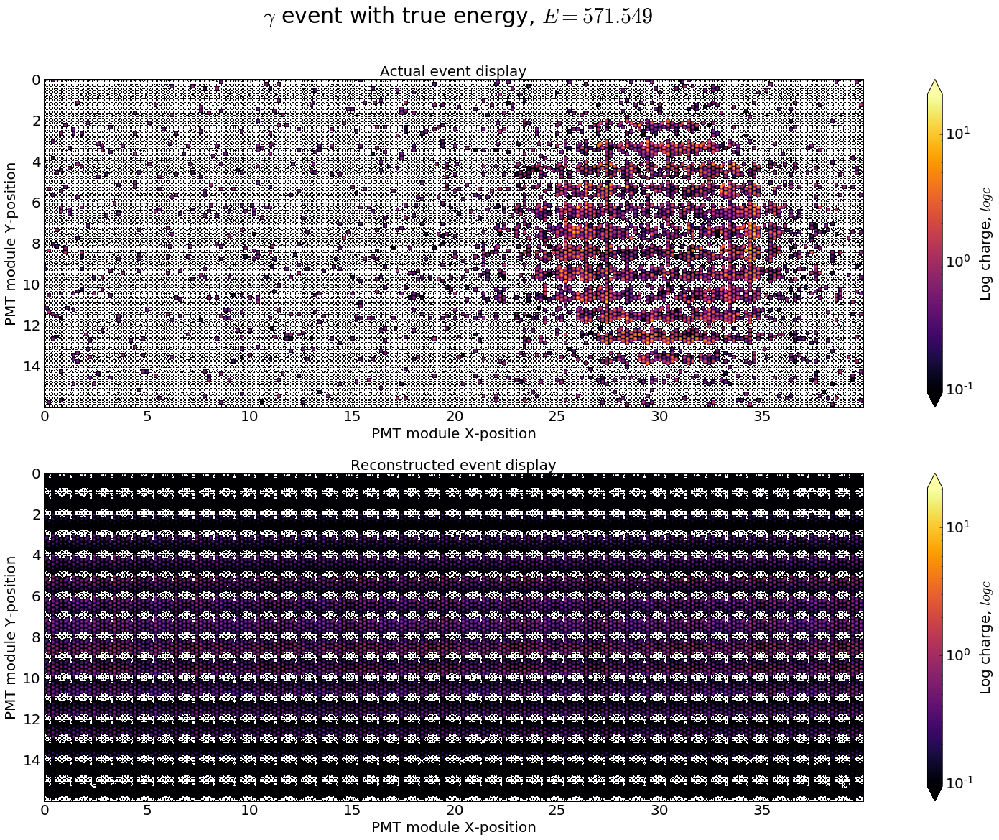

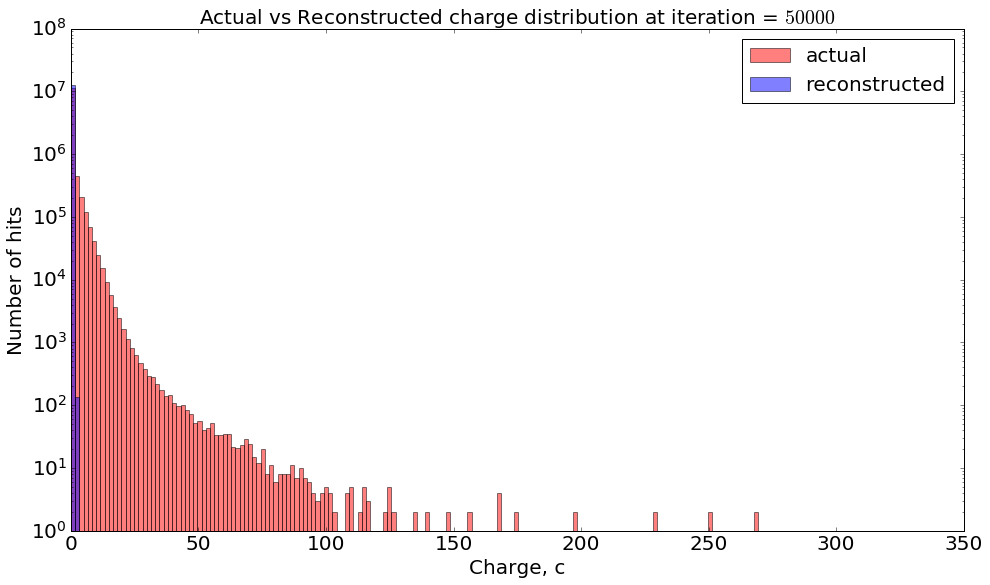

In [8]:
plot_vae_training("20190704_205646", "CnaeNet", 5999)

In [35]:
def plot_val_event(run_id, iteration):
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"

    # Load the numpy array
    np_arr = np.load(np_arr_path)
    np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]
    np_z, np_mu, np_logvar = np_arr["z"], np_arr["mus"], np_arr["logvars"]
    
    i = random.randint(0, np_labels.shape[0]-1)
    plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                    label_dict[np_labels[i]], np_energies[i].item(),
                                    show_plot=True)

    plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                     np_recon, 50000, num_bins=200)

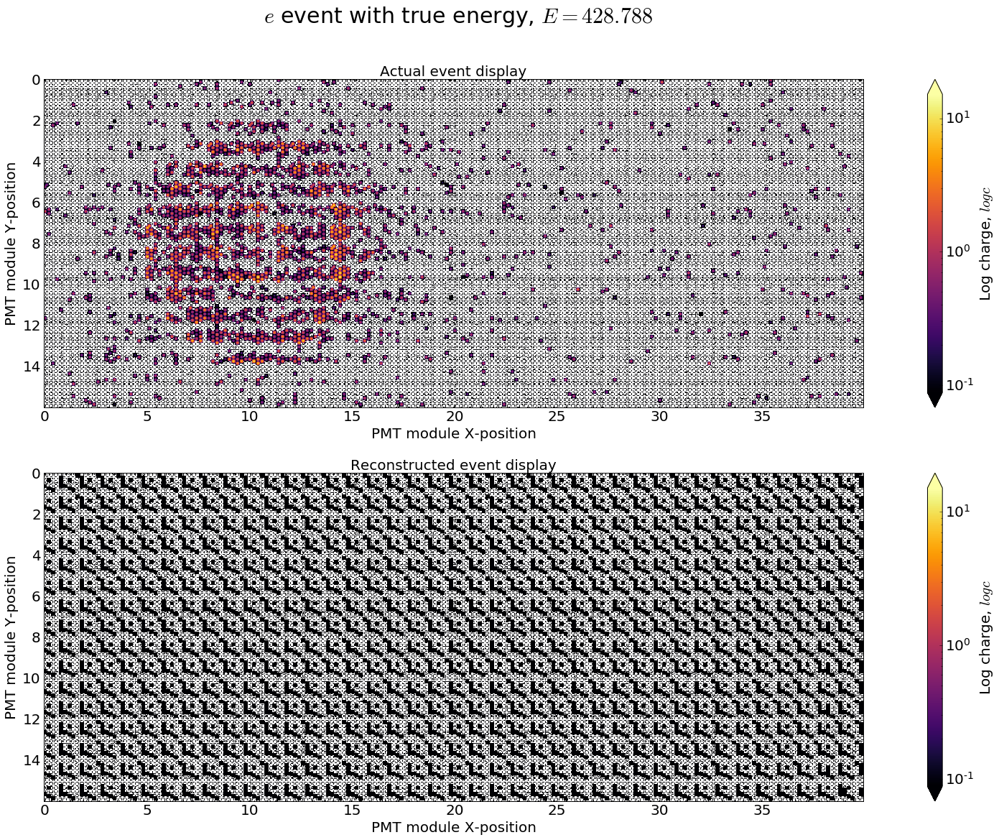

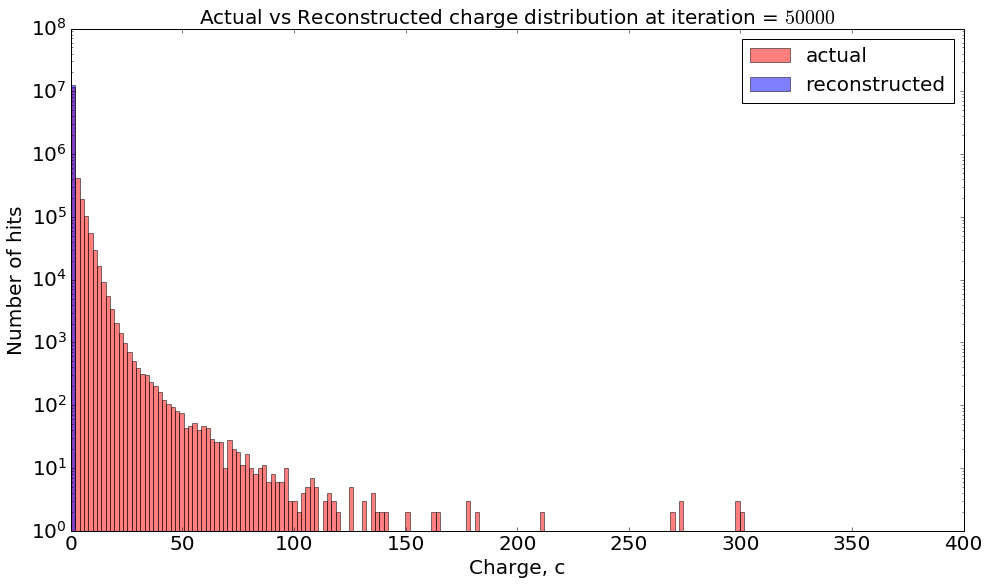

In [36]:
plot_val_event("20190704_220349", "1")

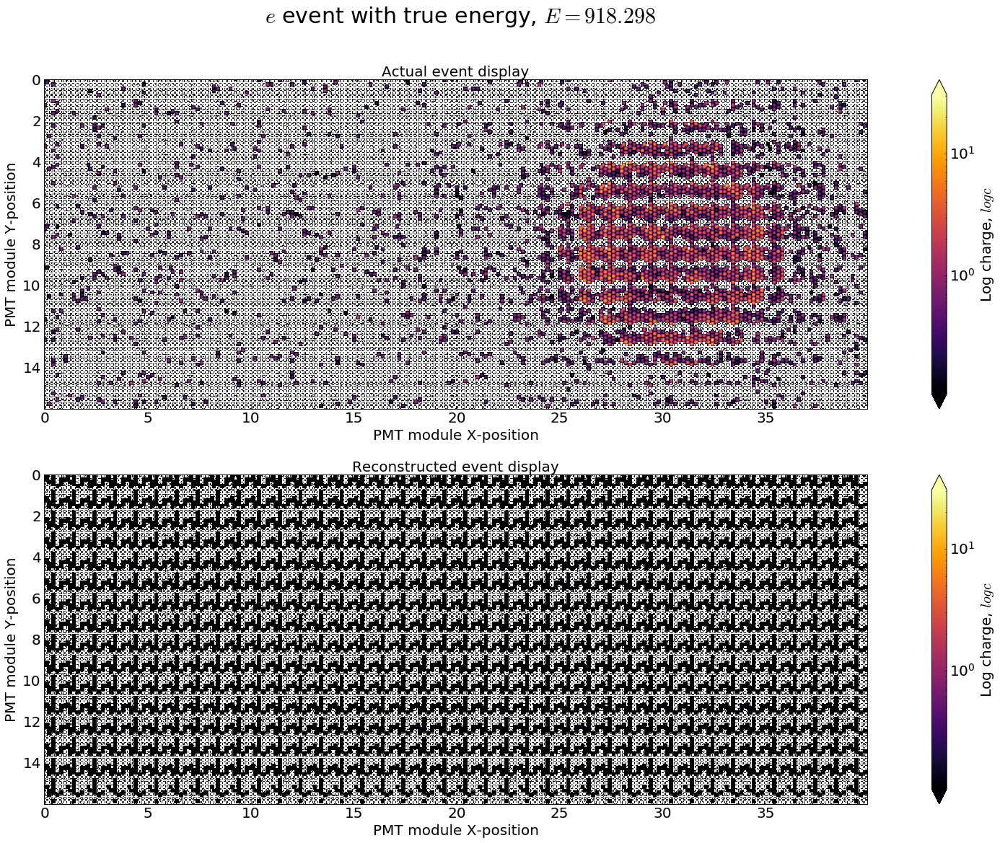

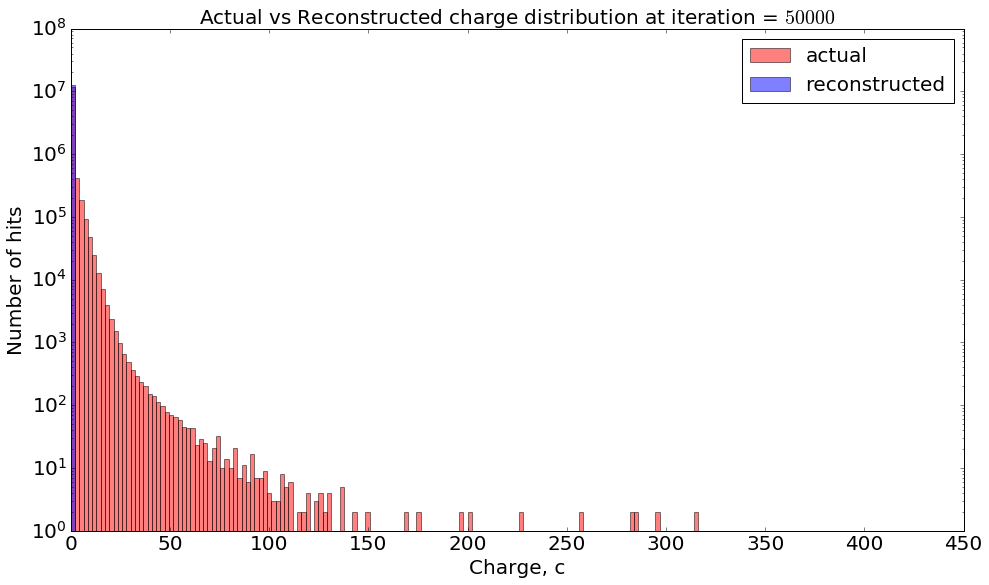

In [43]:
run_id = "20190704_224307"
iteration = "1"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]
np_z, np_mu, np_logvar = np_arr["z"], np_arr["mus"], np_arr["logvars"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[0], np_recon[0], 
                                label_dict[np_labels[0]], np_energies[0].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 50000, num_bins=200)

In [44]:
print(np_z[0].shape)
print(np_z[0])

(5120,)
[-8.56849644e-03 -2.54727229e-02  6.58375621e-02  5.39913774e-04
  1.33300256e-02  4.26042527e-02  4.59053628e-02  4.96485680e-02
  5.90988323e-02  1.04246624e-02  4.08739671e-02  5.01277931e-02
  4.28578109e-02  4.83990237e-02  2.37511843e-02 -3.51124560e-03
  6.01289794e-02  3.93097810e-02  4.75955848e-03  4.69127484e-02
 -1.79138016e-02  1.50906015e-03  1.52314622e-02  1.89216677e-02
  4.35327776e-02 -4.87883575e-04  1.03221368e-02  4.20780294e-02
  4.16429751e-02  3.47031951e-02  2.54749488e-02  5.79975992e-02
  5.52135780e-02  5.72080575e-02  5.11337211e-03  5.73780984e-02
  9.14827734e-02  9.43183005e-02  7.03810677e-02  6.27293065e-02
 -2.29417719e-02  2.15388220e-02 -2.60853348e-03  6.02808073e-02
  2.19831821e-02 -3.35658230e-02  3.47924158e-02  5.05442098e-02
 -3.89670245e-02 -1.62843782e-02 -2.03219391e-02  1.96767114e-02
 -1.24131441e-02 -2.96854638e-02  2.95458995e-02 -3.55625264e-02
  2.68270019e-02 -1.42817460e-02 -9.32177342e-03 -5.48678339e-02
 -9.27453414e-02 

In [45]:
print(np_mu[0].shape)
print(np_mu[0])

(5120,)
[1.46067021e-02 1.26611628e-02 2.02596169e-02 1.69003177e-02
 1.97028816e-02 1.60486083e-02 2.68290751e-02 7.39861727e-02
 6.20040447e-02 5.66846356e-02 1.92656573e-02 1.63642541e-02
 2.05848180e-02 2.31962278e-02 2.19084062e-02 0.00000000e+00
 0.00000000e+00 5.25548831e-02 9.82514769e-03 5.76405972e-02
 1.74829457e-02 1.40518211e-02 1.43392608e-02 1.62500665e-02
 1.67000219e-02 1.40025821e-02 2.15253271e-02 6.88605905e-02
 4.98401076e-02 0.00000000e+00 1.98327564e-02 1.96710508e-02
 1.72062609e-02 1.64574534e-02 1.17665008e-02 0.00000000e+00
 1.77789982e-02 3.59513983e-02 5.17290831e-02 3.82728353e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.22801082e-02 3.28507014e-02 3.33381351e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 2.56523397e-03 1.06978696e-03 0.00000000e+00
 2.98596993e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 3.87074146e-03 

In [47]:
print(np.mean(np_mu[0]))

0.011270608


In [46]:
print(np_logvar[0].shape)
print(np_logvar[0])

(5120,)
[-6.906719  -6.908007  -6.907871  -6.9062185 -6.9093924 -6.90786
 -6.9096107 -6.9075537 -6.9082665 -6.9079943 -6.9064865 -6.909588
 -6.906712  -6.9081526 -6.9082637 -6.908191  -6.9069076 -6.9068255
 -6.907329  -6.9060173 -6.9077387 -6.9072027 -6.907979  -6.9089003
 -6.907937  -6.9093776 -6.905636  -6.907515  -6.9076686 -6.9065647
 -6.90797   -6.9084954 -6.907978  -6.9071693 -6.9098635 -6.9065967
 -6.9080014 -6.9063516 -6.908015  -6.9086757 -6.908902  -6.909022
 -6.9074335 -6.908906  -6.907854  -6.907962  -6.906859  -6.907659
 -6.907242  -6.9098263 -6.909067  -6.907333  -6.9079337 -6.909753
 -6.908495  -6.9077415 -6.9065475 -6.9078503 -6.908854  -6.906391
 -6.908688  -6.9091225 -6.908283  -6.911222  -6.9078875 -6.906587
 -6.9087667 -6.909025  -6.9086633 -6.9082675 -6.906927  -6.908454
 -6.9079885 -6.9095764 -6.908749  -6.9078918 -6.90879   -6.905992
 -6.9083986 -6.909126  -6.9074917 -6.9077935 -6.9073086 -6.9072933
 -6.9094067 -6.907153  -6.908623  -6.90805   -6.908228  -6.90736

In [49]:
print(np.mean(np_logvar[0]))

-6.9077735


In [50]:
print(np.exp(np.mean(np_logvar[0])))

0.0009999818


## AE Saved state reconstructions

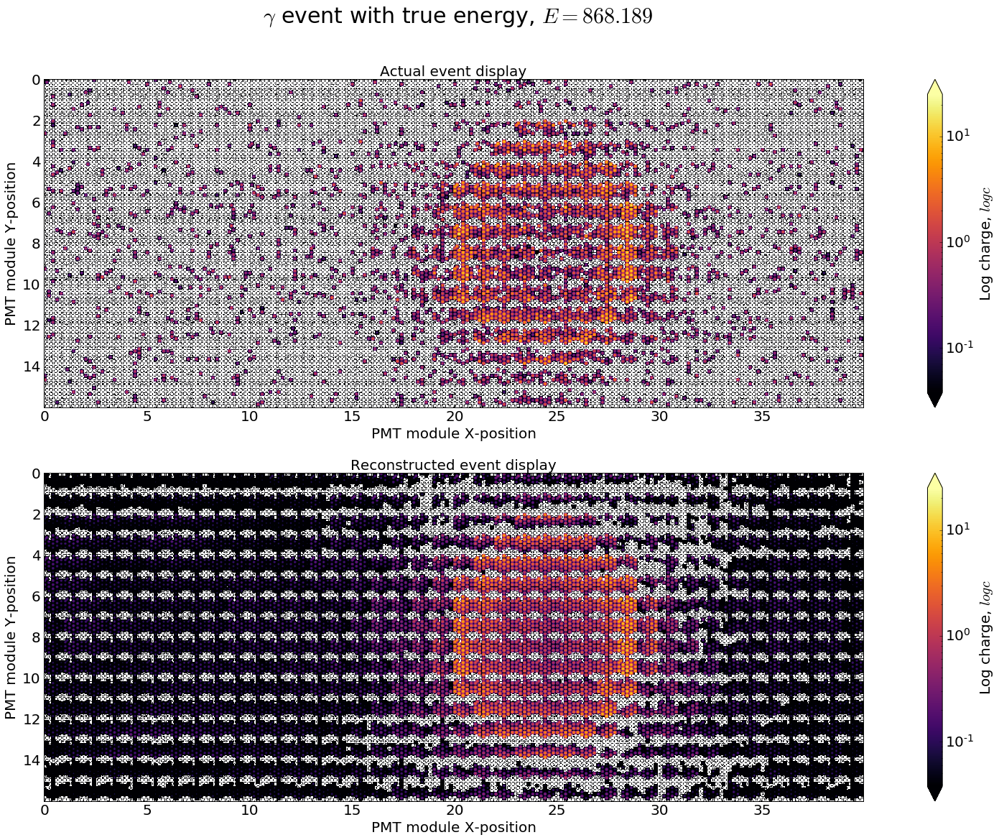

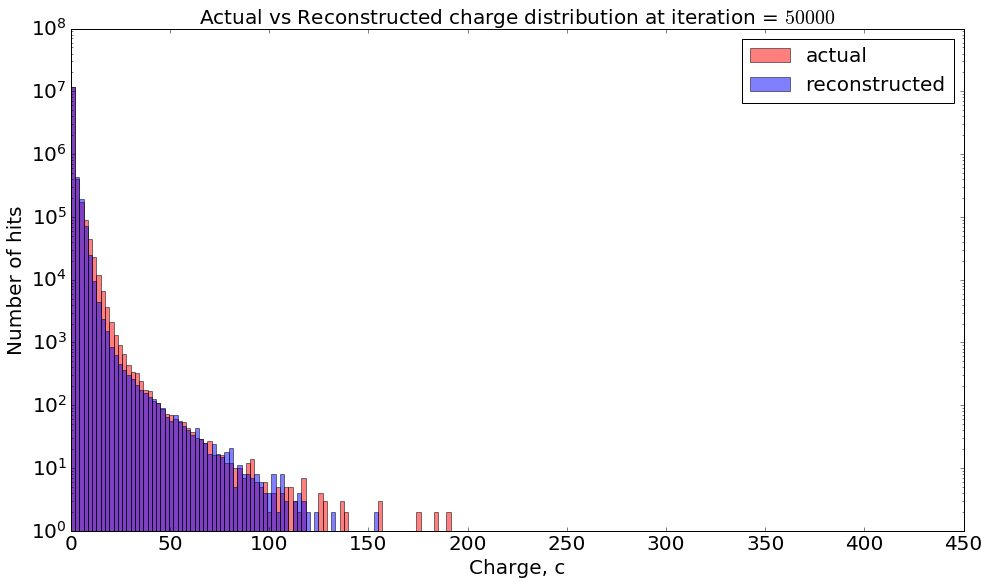

In [60]:
run_id = "20190704_235247"
iteration = "1"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]
#np_z, np_mu, np_logvar = np_arr["z"], np_arr["mus"], np_arr["logvars"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 50000, num_bins=200)

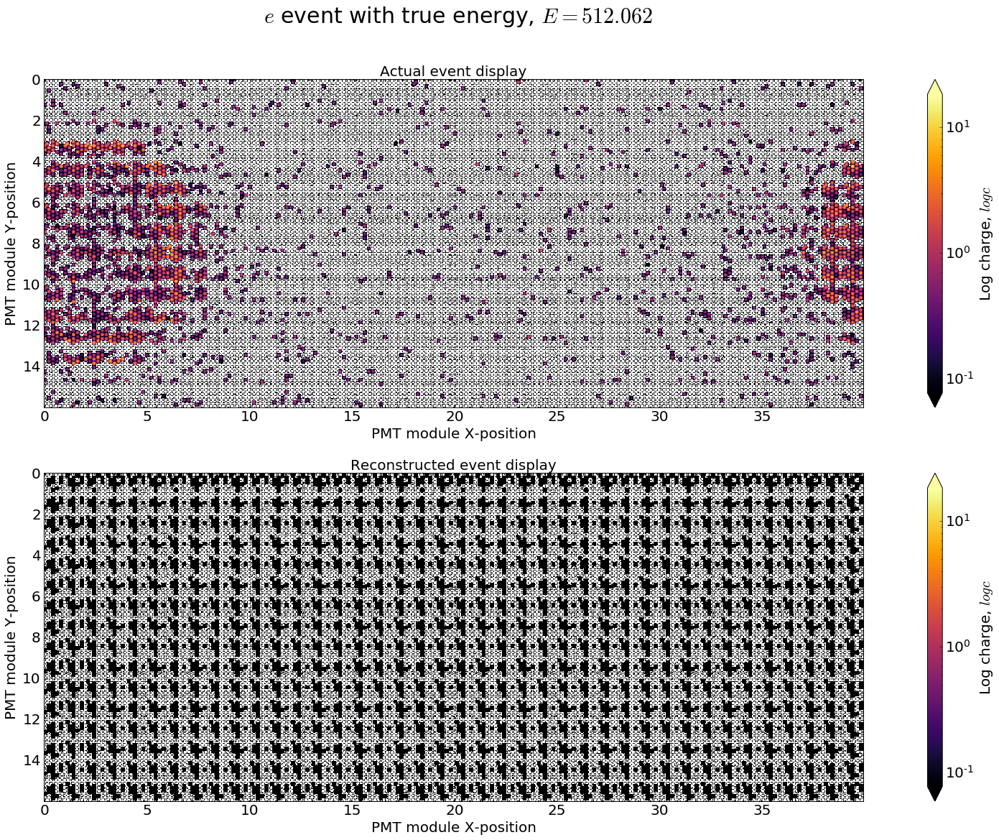

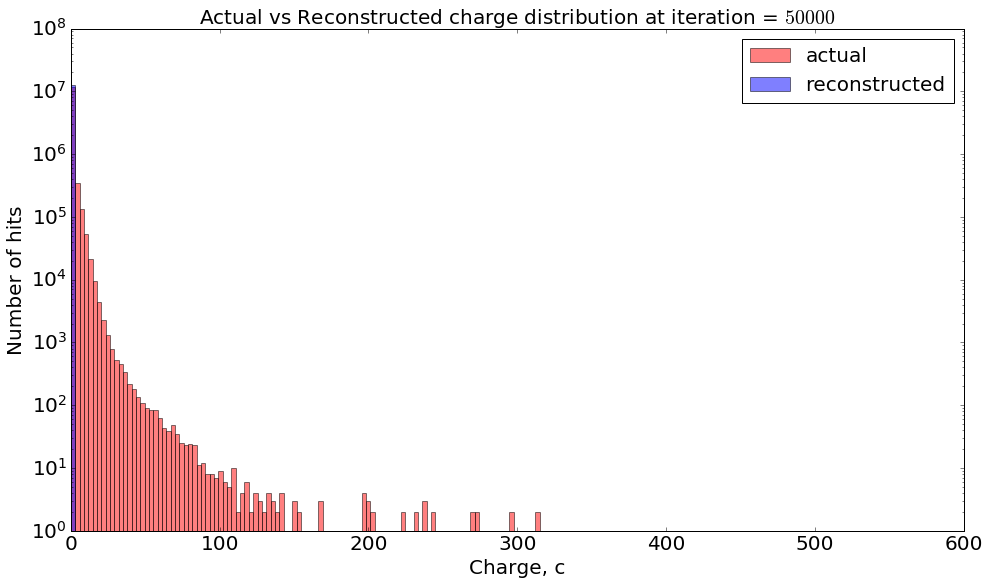

In [59]:
run_id = "20190704_235741"
iteration = "1"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"

# Load the numpy array
np_arr = np.load(np_arr_path)
np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["recons"], np_arr["labels"], np_arr["energies"]
#np_z, np_mu, np_logvar = np_arr["z"], np_arr["mus"], np_arr["logvars"]

i = random.randint(0, np_labels.shape[0]-1)
plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                label_dict[np_labels[i]], np_energies[i].item(),
                                show_plot=True)

plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                 np_recon, 50000, num_bins=200)